# Wind in situ comparison

In [1]:
import sys
import os
import glob
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import glob
import calendar
import seaborn as sns
sys.path.append('/g/data/qz03/wp3/code/git-repo')
from utils import *
from scipy import stats
import itertools

In [2]:
#switch to select 3x3 grid box from reanalyses when comparing to in situ point data
grid_box_select_switch = True

In [3]:
import warnings
import logging
warnings.filterwarnings('ignore') 
logging.getLogger("distributed.worker.memory").setLevel(logging.ERROR)
logging.getLogger('flox').setLevel(logging.WARNING)

In [4]:
import dask
import tempfile
from dask.diagnostics import ProgressBar
from dask.distributed import Client, LocalCluster

dask.config.set({
    'array.chunk-size': "256 MiB",
    'array.slicing.split_large_chunks': True, #This can make AXIOM very slow
    'distributed.comm.timeouts.connect': '120s',
    'distributed.comm.timeouts.tcp': '120s',
    'distributed.comm.retry.count': 10,
    'distributed.scheduler.allowed-failures': 20,
    "distributed.scheduler.worker-saturation": 1.1, #This should use the new behaviour which helps with memory pile up
})

# client = dask.distributed.Client()
client = Client(n_workers=10, threads_per_worker=1, local_directory = tempfile.mkdtemp(), memory_limit = "63000mb")
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 10
Total threads: 10,Total memory: 586.73 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:32899,Workers: 0
Dashboard: /proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:39331,Total threads: 1
Dashboard: /proxy/36967/status,Memory: 58.67 GiB
Nanny: tcp://127.0.0.1:45143,


## Data Availability

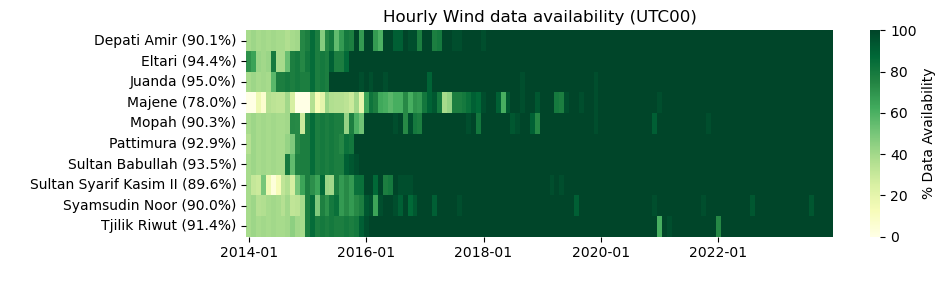

<Figure size 640x480 with 0 Axes>

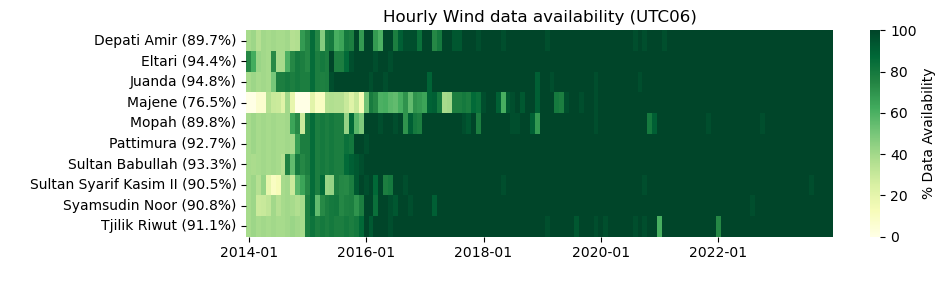

<Figure size 640x480 with 0 Axes>

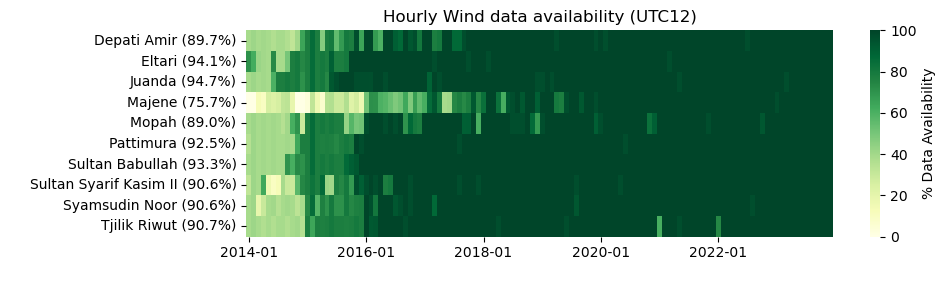

<Figure size 640x480 with 0 Axes>

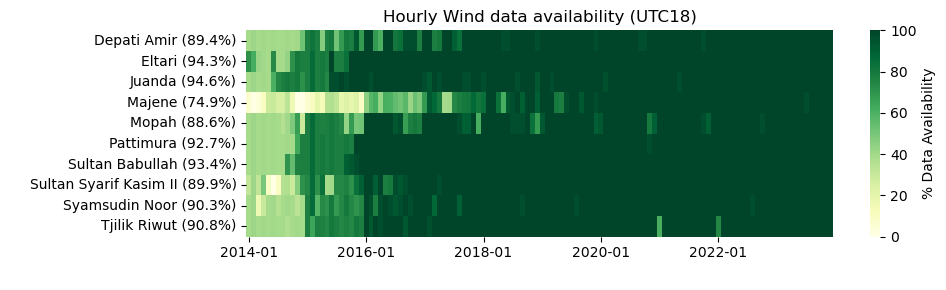

<Figure size 640x480 with 0 Axes>

In [5]:
wind_station_latlon_df = pd.read_csv('/g/data/qz03/wp3/data/obs/wind-and-rain/hourly-wind/station_metadata.csv').drop(columns=['No']).dropna()
base_dir = '/g/data/qz03/wp3/data/obs/wind-and-rain/hourly-wind/'
for target_utc in ['00.csv', '06.csv', '12.csv', '18.csv']: 
    files = [
        os.path.join(base_dir, station_name, target_utc)
        for station_name in [station_folder for station_folder in os.listdir('/g/data/qz03/wp3/data/obs/wind-and-rain/hourly-wind') if '9' in station_folder]
        if os.path.isfile(os.path.join(base_dir, station_name, target_utc))]
    
    dfs = {f.split('/')[-2].replace('.csv',''): pd.read_csv(f, parse_dates=['DATA TIMESTAMP']) for f in files}
    
    df_list = [df['DATA TIMESTAMP'].dt.to_period('M').drop_duplicates() for df in dfs.values()]
    all_months = pd.Index(pd.concat(df_list).drop_duplicates()).sort_values()
    
    availability = pd.DataFrame(index=dfs.keys(), columns=all_months.astype(str))
    for station, df in dfs.items():
        df['year_month'] = df['DATA TIMESTAMP'].dt.to_period('M')
        total_per_month = df.groupby('year_month').size()
        avail_per_month = df.groupby('year_month')['WIND SPEED FF'].apply(lambda x: x.notna().sum())
        pct = (avail_per_month / total_per_month).reindex(all_months, fill_value=0) * 100
        availability.loc[station] = pct.values
    
    availability.index = availability.index.str[:5]
    new_index = []
    for station, df in dfs.items():
        total = len(df)
        available = df['WIND SPEED FF'].notna().sum()
        percent = (available / total) * 100 if total > 0 else 0
        station_name = wind_station_latlon_df[wind_station_latlon_df['WMO ID'] == int(station[:5])]['Station Name'].values[0]
        label = f"{station_name} ({percent:.1f}%)"
        new_index.append(label)
    
    availability.index = new_index
    availability.sort_index(inplace=True)
    plt.figure(figsize=(10, len(dfs)*0.05 + 2.5))
    sns.heatmap(availability.astype(float), cmap="YlGn", cbar_kws={'label': '% Data Availability'}, xticklabels=24)
    plt.title(f"Hourly Wind data availability (UTC{target_utc[:2]})")
    plt.ylabel(' ')
    plt.xlabel(' ')
    plt.tight_layout()
    plt.show()
    plt.clf()


In [6]:
wind_station_latlon_df.sort_values(by='Station Name', inplace=True)
wind_station_latlon_df['status'] = [1, 1, 1, 2, 2, 1, 1, 2, 1, 1]

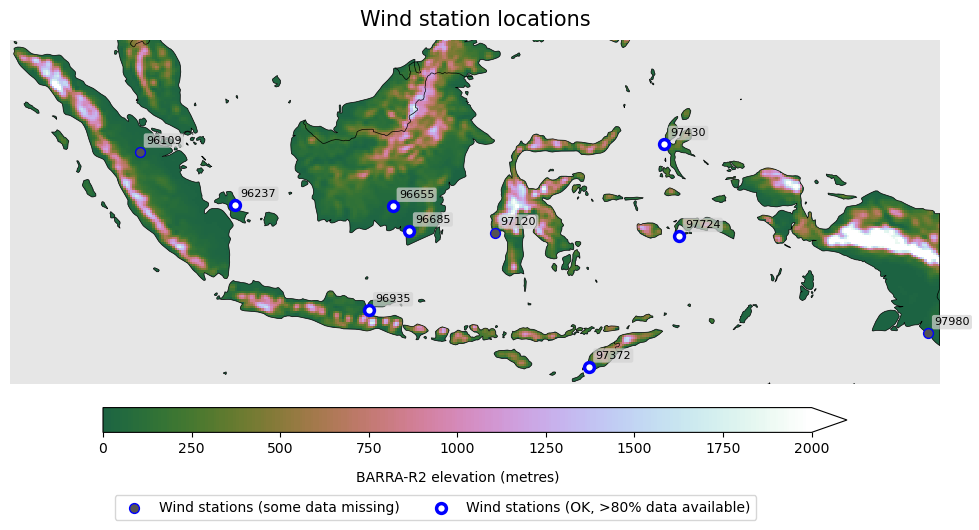

<Figure size 640x480 with 0 Axes>

In [7]:
from matplotlib.lines import Line2D
import matplotlib.colors as mcolors

barra_topo = xr.open_dataset(f'{barraR2_dir}fx/orog/v20231001/orog_AUS-11_ERA5_historical_hres_BOM_BARRA-R2_v1.nc').sel(lat=slice(domain_dict['indonesia']['lat_min'], domain_dict['indonesia']['lat_max']), lon=slice(domain_dict['indonesia']['lon_min'], domain_dict['indonesia']['lon_max']))
fig, ax = plt.subplots(figsize=(12, 6), subplot_kw={'projection': ccrs.PlateCarree()})
contour = barra_topo.orog.plot.imshow(ax=ax, transform=ccrs.PlateCarree(), vmax=2000, cmap=mcolors.LinearSegmentedColormap.from_list('trunc', plt.get_cmap('cubehelix')(np.linspace(5/17, 1, 256))), add_colorbar=False)
cbar = plt.colorbar(contour, ax=ax, orientation='horizontal', extend='max', shrink=0.8, aspect=30, pad=0.05)
cbar.set_label('BARRA-R2 elevation (metres)', labelpad=10)
ax.set_title("Wind station locations", size=15, pad=10)
ax.add_feature(cfeature.BORDERS, linewidth=0.5, edgecolor='black', zorder=10, alpha=1)
ax.add_feature(cfeature.LAND, linewidth=0.5, edgecolor='black', facecolor='none', zorder=10, alpha=1)
ax.add_feature(cfeature.OCEAN, zorder=0, facecolor='#e6e6e6', alpha=1)
ax.set_frame_on(False)

ax.scatter(wind_station_latlon_df.loc[wind_station_latlon_df['status'] == 2, 'Lon'], wind_station_latlon_df.loc[wind_station_latlon_df['status'] == 2, 'Lat'], transform=ccrs.PlateCarree(), marker='o', color='#545353', edgecolor='blue', s=50, linewidth=1, label='Wind stations (some data missing)', zorder=20)
ax.scatter(wind_station_latlon_df.loc[wind_station_latlon_df['status'] == 1, 'Lon'], wind_station_latlon_df.loc[wind_station_latlon_df['status'] == 1, 'Lat'], transform=ccrs.PlateCarree(), marker='o', color='white', edgecolor='blue', s=50, linewidth=2.5, label='Wind stations (OK, >80% data available)', zorder=20)

for _, row in wind_station_latlon_df.iterrows():
    ax.text(row['Lon']+0.3, row['Lat']+0.3, str(int(row['WMO ID'])), transform=ccrs.PlateCarree(),
            fontsize=8, ha='left', va='bottom', zorder=25, color='black', bbox=dict(facecolor='lightgrey', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2'))


ax.legend(ncol=2, bbox_to_anchor=(0.81, -0.3))
plt.show()
plt.clf()

## Evaluation

In [8]:
wind_station_latlon_df = pd.read_csv('/g/data/qz03/wp3/data/obs/wind-and-rain/hourly-wind/station_metadata.csv').drop(columns=['No']).dropna()
wind_station_df = pd.concat([pd.read_csv(f, parse_dates=['DATA TIMESTAMP']).assign(station_id=f.split('_')[0].split('/')[-2]) for f in glob.glob('/g/data/qz03/wp3/data/obs/wind-and-rain/hourly-wind/*/*.csv')], ignore_index=True)#.replace(0, np.nan, inplace=True)

barra_winds_hly = xr.open_mfdataset(glob.glob('/g/data/qz03/wp3/data/reanalysis/BARRAR2/1hr/sfcWind/*.nc'),combine='nested', concat_dim='time',parallel=True, engine='netcdf4').chunk({'time':-1, 'lat':'auto', 'lon':'auto'})
barra_u10_hly = xr.open_mfdataset(glob.glob('/g/data/qz03/wp3/data/reanalysis/BARRAR2/1hr/uas/*.nc'),combine='nested', concat_dim='time',parallel=True, engine='netcdf4').chunk({'time':-1, 'lat':'auto', 'lon':'auto'})
barra_v10_hly = xr.open_mfdataset(glob.glob('/g/data/qz03/wp3/data/reanalysis/BARRAR2/1hr/vas/*.nc'),combine='nested', concat_dim='time',parallel=True, engine='netcdf4').chunk({'time':-1, 'lat':'auto', 'lon':'auto'})

era_u10_hly = xr.open_mfdataset(glob.glob('/g/data/qz03/wp3/data/reanalysis/ERA5/10u/*.nc'),combine='nested', concat_dim='time',parallel=True, engine='netcdf4').chunk({'time':-1, 'latitude':'auto', 'longitude':'auto'}).rename({'latitude': 'lat'}).rename({'longitude': 'lon'})
era_v10_hly = xr.open_mfdataset(glob.glob('/g/data/qz03/wp3/data/reanalysis/ERA5/10v/*.nc'),combine='nested', concat_dim='time',parallel=True, engine='netcdf4').chunk({'time':-1, 'latitude':'auto', 'longitude':'auto'}).rename({'latitude': 'lat'}).rename({'longitude': 'lon'})

In [9]:
del df

In [10]:
def plot_windrose(df, title_substring):
    plt.rcParams.update({'font.size': 20})
    ws_keys = ['WIND SPEED FF', 'BARRA_WS', 'ERA5_WS']
    wd_keys = ['WIND DIR DEG DD', 'BARRA_WD', 'ERA5_WD']
    title_keys = ['Obs', 'BARRA', 'ERA5']
    
    # df['DATA TIMESTAMP'] = pd.to_datetime(df['DATA TIMESTAMP'])
    for wind_idx in range(0, 3):
        wd = df[wd_keys[wind_idx]].to_numpy()
        ws = df[ws_keys[wind_idx]].to_numpy()
        # for utc_time in [0,6,12,18]:
        #     plot_df = df[df['DATA TIMESTAMP'].dt.hour == utc_time]
        #     wd = plot_df[wd_keys[wind_idx]].to_numpy()
        #     ws = plot_df[ws_keys[wind_idx]].to_numpy()
        dir_bins = np.arange(0, 360, 22.5)
        speed_bins = [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20]
        frequency = np.zeros((len(dir_bins), len(speed_bins) - 1))
        
        for i, d in enumerate(dir_bins):
            mask = (wd >= d) & (wd < d + 30)
            hist, _ = np.histogram(ws[mask], bins=speed_bins)
            frequency[i] = hist
    
    
        frequency = frequency / np.sum(frequency) * 100
        theta = np.radians(dir_bins + 11.25)
        width = np.radians(22.5)
        bottom = np.zeros(len(dir_bins))
        colors = plt.cm.YlGnBu(np.linspace(0, 1, frequency.shape[1]))
        
        fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(8, 8))
        for i in range(frequency.shape[1]):
            ax.bar(theta, frequency[:, i], width=width, bottom=bottom, color=colors[i], edgecolor='k', linewidth=0.0, label=f'{speed_bins[i]}–{speed_bins[i+1]} m/s')
            bottom += frequency[:, i]
    
        ax.set_theta_zero_location('N')
        ax.set_theta_direction(-1)
    
        cardinal_labels = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE',
                           'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
        cardinal_angles = np.radians(np.arange(0, 360, 22.5))
        ax.set_xticks(cardinal_angles)
        ax.set_xticklabels(cardinal_labels)
        ax.grid(linewidth=0.5)
        ax.set_rlabel_position(225)
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}%'))
        ax.set_title(f'{title_substring}\n{title_keys[wind_idx]} Wind Rose')
        # ax.set_title(f'Station {int(station_id)}\n{title_keys[wind_idx]} Wind Rose (UTC{str(utc_time).zfill(2)})')
        # ax.legend(loc='lower left', bbox_to_anchor=(1.1, 0.1))
        plt.tight_layout()
        plt.show()
    return

In [11]:
def plot_windrose_legend():
    plt.rcParams.update({'font.size': 20})
    speed_bins = [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20]
    colors = plt.cm.YlGnBu(np.linspace(0, 1, len(speed_bins) - 1))

    handles = []
    labels = []
    for i in range(len(speed_bins) - 1):
        label = f'{speed_bins[i]}–{speed_bins[i+1]} m/s'
        patch = plt.Line2D([0], [0], marker='s', color='w',
                           markerfacecolor=colors[i], markersize=15, markeredgecolor='black', markeredgewidth=0.5, label=label)
        handles.append(patch)
        labels.append(label)

    fig, ax = plt.subplots(figsize=(8, 2))
    ax.axis('off')
    legend = ax.legend(handles=handles, labels=labels, loc='center', ncol=len(labels), columnspacing=0.3, labelspacing=0, handletextpad=0)
    plt.tight_layout()
    plt.show()


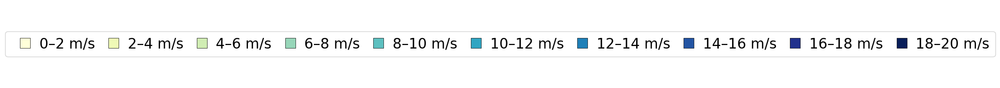

In [12]:
plot_windrose_legend()

In [13]:
def grid_box_select(u10_reanalysis, v10_reanalysis, model_res):
    u10 = []
    v10 = []
    for lat_offset, lon_offset in itertools.product([-model_res, 0, model_res], [-model_res, 0, model_res]):
        u10.append(u10_reanalysis.sel(lat=lat+lon_offset, lon=lon, method='nearest').compute().sortby("time"))
        v10.append(v10_reanalysis.sel(lat=lat+lon_offset, lon=lon, method='nearest').compute().sortby("time"))
    u10_pt = xr.concat(u10, dim='z').mean('z').compute().sortby("time")
    v10_pt = xr.concat(v10, dim='z').mean('z').compute().sortby("time")
    return u10_pt, v10_pt

In [14]:
def point_select(u10_reanalysis, v10_reanalysis):
    u10_pt = u10_reanalysis.sel(lat=lat, lon=lon, method='nearest').compute().sortby("time")
    v10_pt = v10_reanalysis.sel(lat=lat, lon=lon, method='nearest').compute().sortby("time")
    return u10_pt, v10_pt

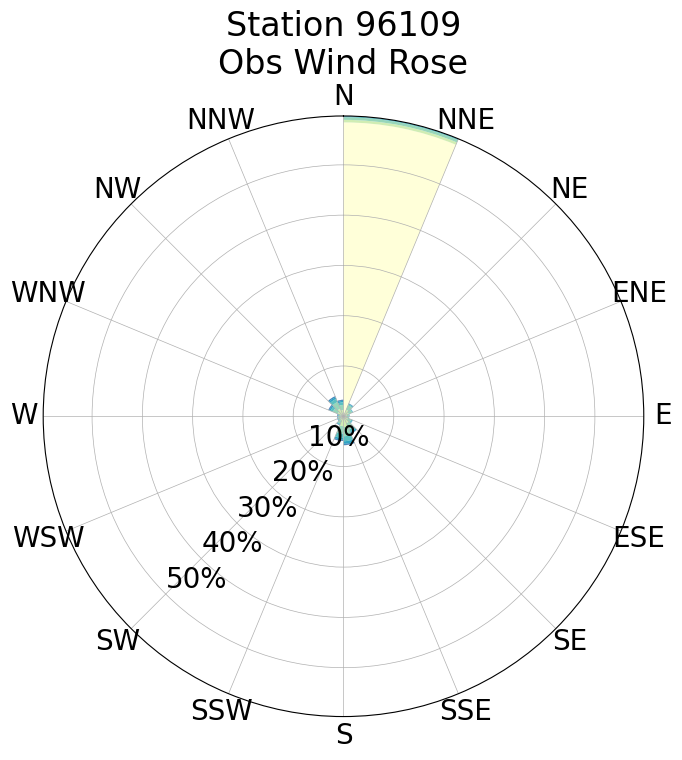

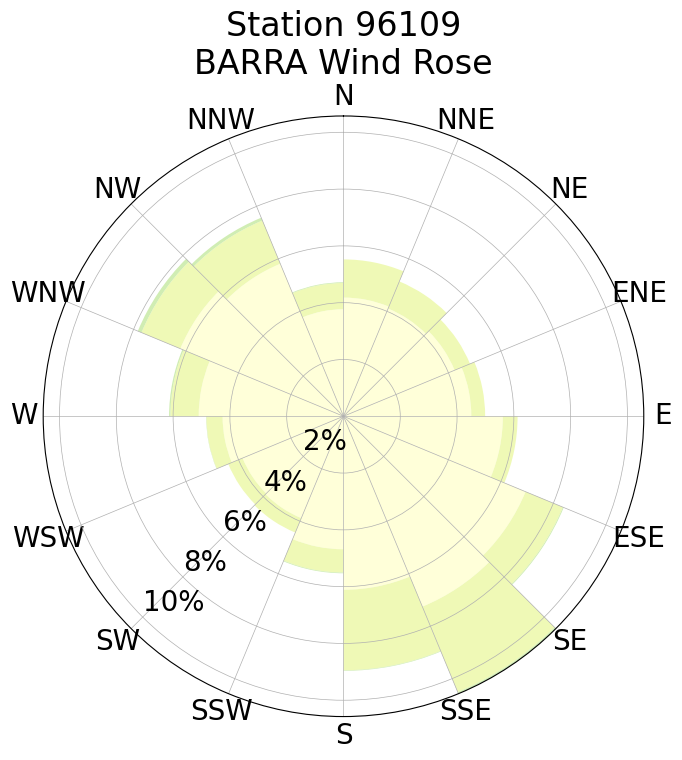

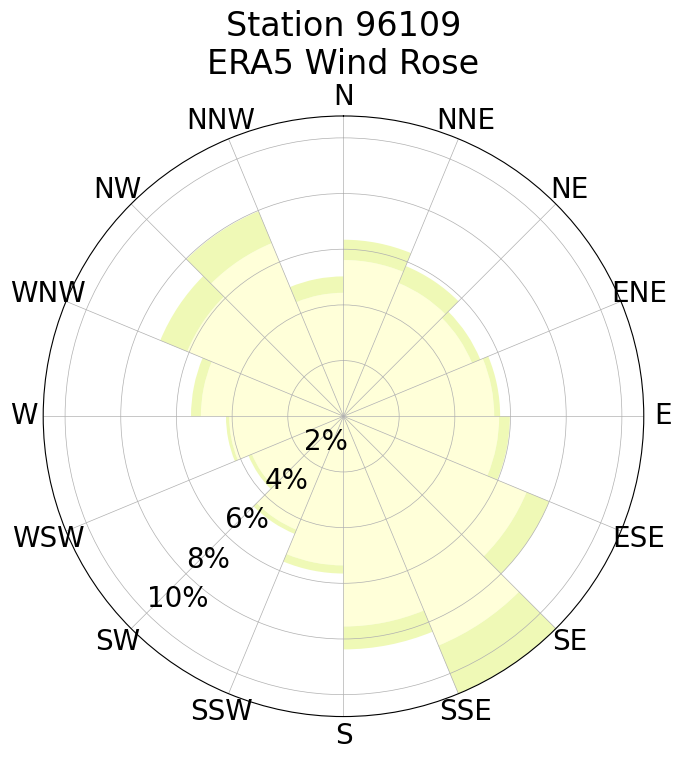

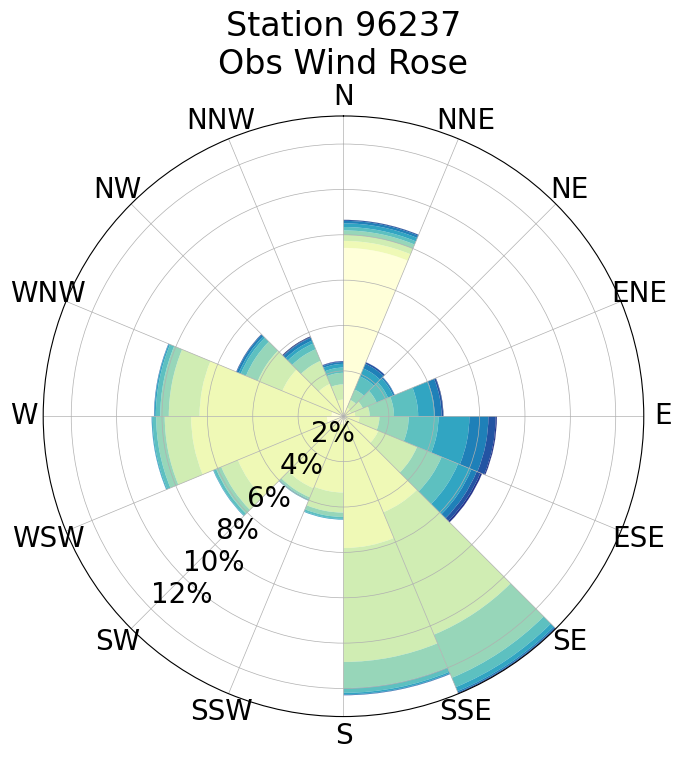

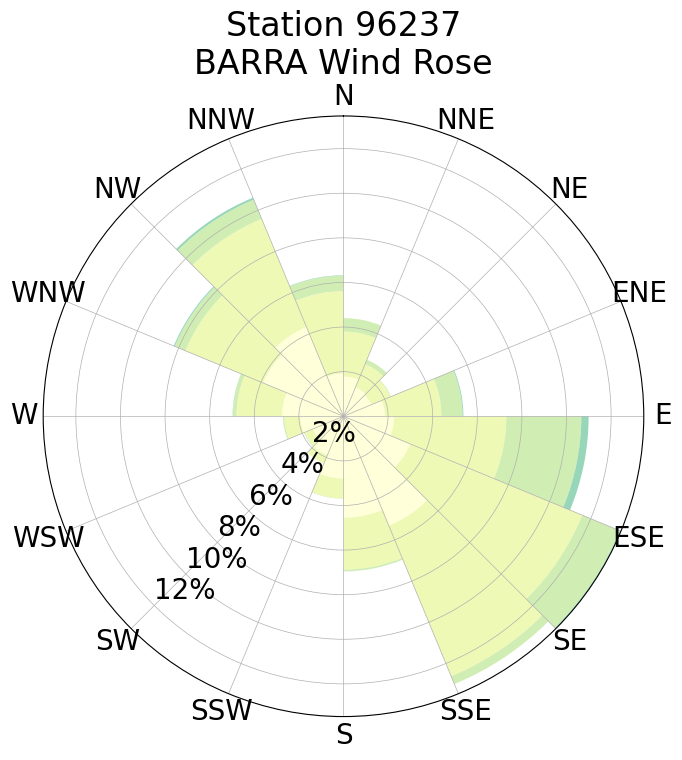

...

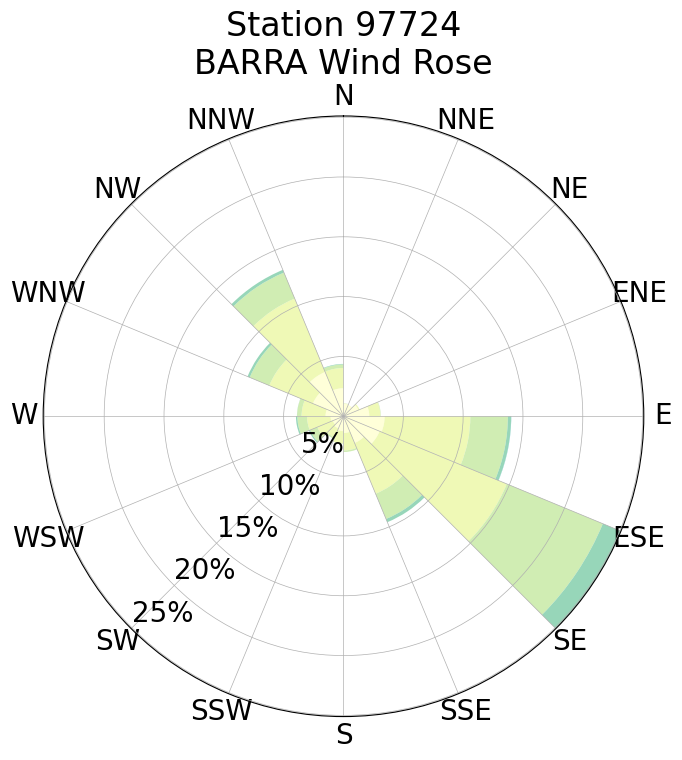

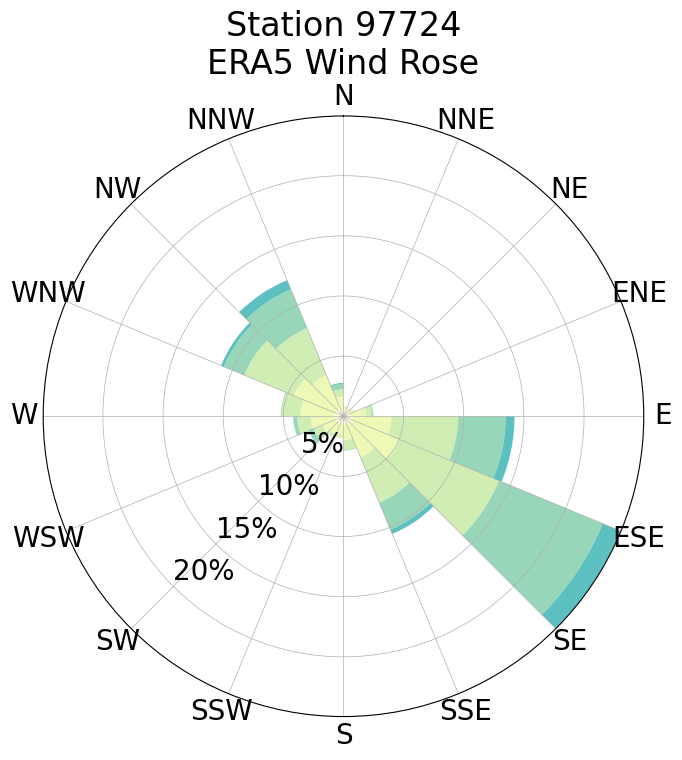

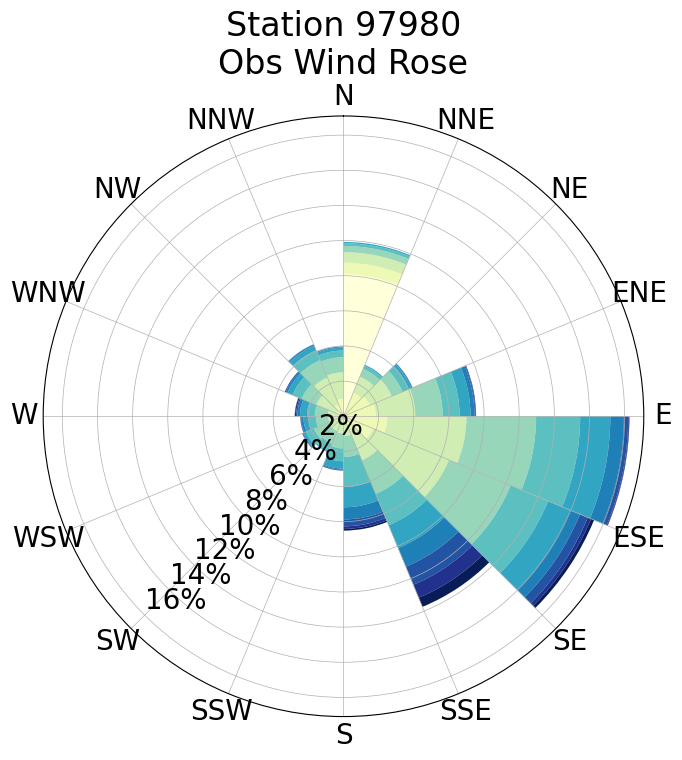

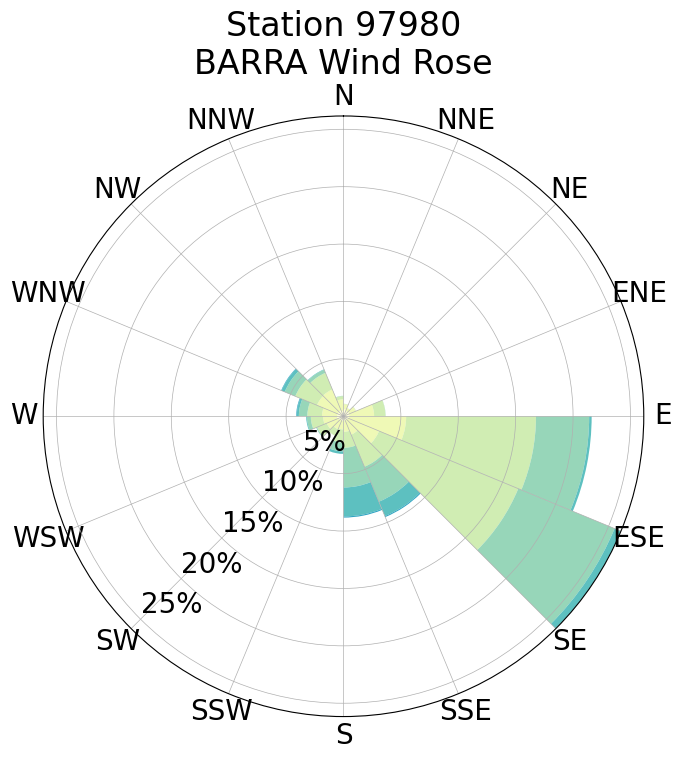

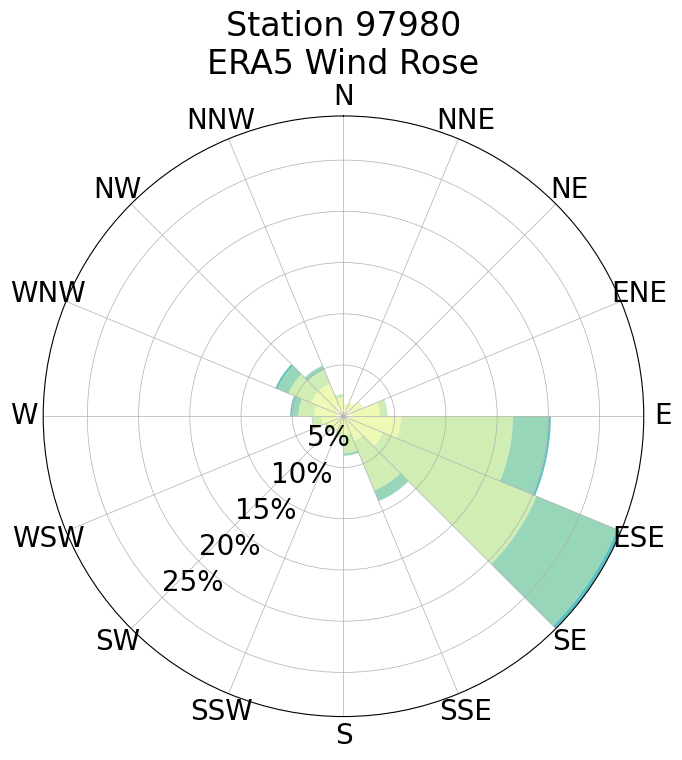

CPU times: user 13min 13s, sys: 1min, total: 14min 13s
Wall time: 28min 28s


In [15]:
%%time
agg_df = []
# Iterate over each station
for station_id in wind_station_latlon_df['WMO ID']:
    sid_str = f"{station_id:.0f}"
    lat, lon = wind_station_latlon_df.loc[wind_station_latlon_df['WMO ID'] == station_id, ['Lat', 'Lon']].values[0]
    station_df = wind_station_df[wind_station_df['station_id'] == sid_str].copy()
    station_df['DATA TIMESTAMP'] = pd.to_datetime(station_df['DATA TIMESTAMP'])

    # BARRA extract
    u10_pt, v10_pt = grid_box_select(barra_u10_hly, barra_v10_hly, 0.1) if grid_box_select_switch == True else point_select(barra_u10_hly, barra_v10_hly)
    barra_ws = ((u10_pt.uas ** 2 + v10_pt.vas ** 2) ** 0.5).sortby("time")
    barra_wd = ((np.degrees(np.arctan2(-u10_pt.uas, -v10_pt.vas))) % 360)
    
    # ERA5 extract
    u10_pt, v10_pt = grid_box_select(era_u10_hly, era_v10_hly, 0.25) if grid_box_select_switch == True else point_select(era_u10_hly, era_v10_hly)
    era5_ws = ((u10_pt.u10 ** 2 + v10_pt.v10 ** 2) ** 0.5).sortby("time")
    era5_wd = ((np.degrees(np.arctan2(-u10_pt.u10, -v10_pt.v10))) % 360)

    # Convert to pandas Series and reset index
    barra_ws_series = barra_ws.to_series().reset_index(name='BARRA_WS').sort_values('time')
    barra_wd_series = barra_wd.to_series().reset_index(name='BARRA_WD').sort_values('time')
    era5_ws_series = era5_ws.to_series().reset_index(name='ERA5_WS').sort_values('time')
    era5_wd_series = era5_wd.to_series().reset_index(name='ERA5_WD').sort_values('time')

    # Merge station data with reanalysis data on time
    df = pd.merge_asof(
        pd.merge_asof(
            pd.merge_asof(
                pd.merge_asof(station_df.sort_values('DATA TIMESTAMP'), barra_ws_series, left_on='DATA TIMESTAMP', right_on='time', direction='nearest').drop(columns='time'),
                barra_wd_series, left_on='DATA TIMESTAMP', right_on='time', direction='nearest').drop(columns='time'),
            era5_ws_series, left_on='DATA TIMESTAMP', right_on='time', direction='nearest').drop(columns='time'),
        era5_wd_series, left_on='DATA TIMESTAMP', right_on='time', direction='nearest').drop(columns='time')

    
    plot_windrose(df, f'Station {int(station_id)}')
    agg_df.append(df)

In [16]:
wind_station_df = pd.concat(agg_df)
daily_df = wind_station_df.groupby([wind_station_df['DATA TIMESTAMP'].dt.to_period('D'), 'station_id']).mean(numeric_only=True).reset_index()

In [17]:
daily_df

,DATA TIMESTAMP,station_id,WIND DIR DEG DD,WIND SPEED FF,BARRA_WS,BARRA_WD,ERA5_WS,ERA5_WD
0,2014-01-01,96109,0.00,0.000,1.390895,119.340080,1.201198,80.705772
1,2014-01-01,96237,2.50,0.750,2.272731,310.263214,3.865892,328.839508
2,2014-01-01,96655,117.50,1.500,1.012739,188.452591,1.025118,192.100357
3,2014-01-01,96685,62.50,1.250,1.617384,190.464951,1.395944,217.105408
4,2014-01-01,96935,240.00,5.250,1.822841,244.131714,1.822181,267.572296
...,...,...,...,...,...,...,...,...
14395,2023-12-12,97120,223.75,3.875,3.041079,256.242798,3.417742,310.818420
14396,2023-12-12,97372,270.00,4.375,1.950316,312.019623,2.810570,298.935699
14397,2023-12-12,97430,222.50,6.125,2.455912,106.716751,3.868330,176.883881
14398,2023-12-12,97724,95.00,3.250,4.353047,329.625793,6.935181,326.352539


In [18]:
# daily_df['DATA TIMESTAMP'] = pd.to_datetime(daily_df['DATA TIMESTAMP'])
wet_season_data = wind_station_df[wind_station_df['DATA TIMESTAMP'].dt.month.isin([11, 12, 1, 2, 3])]
dry_season_data = wind_station_df[wind_station_df['DATA TIMESTAMP'].dt.month.isin([4, 5, 6, 7, 8, 9, 10])]

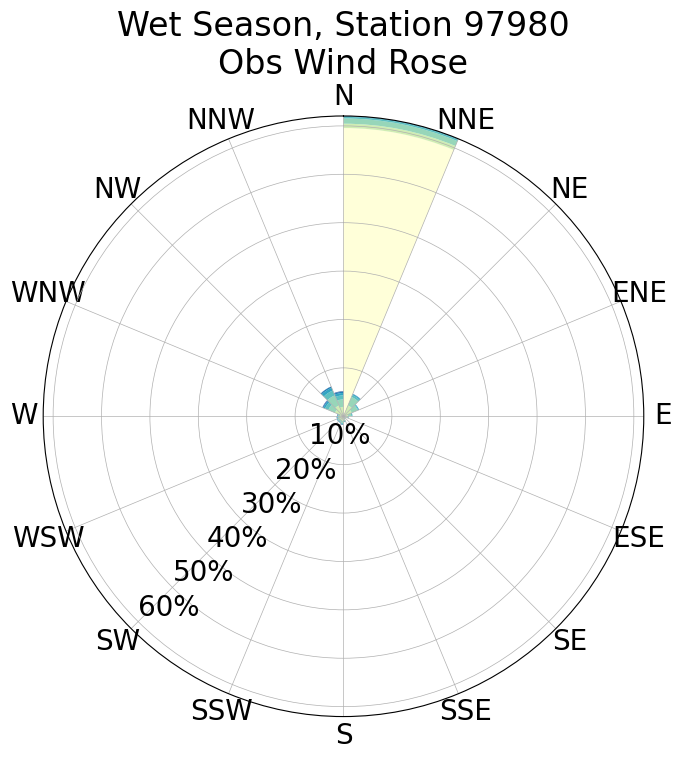

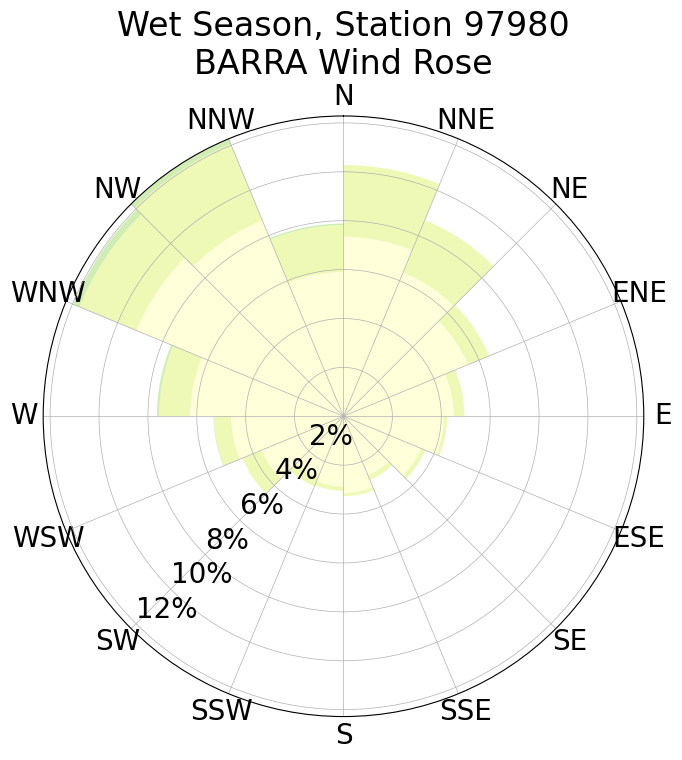

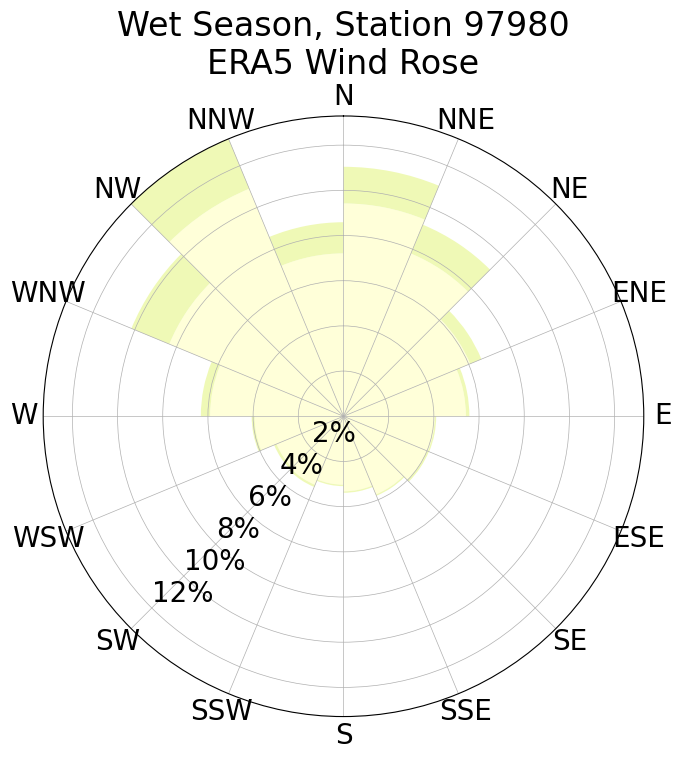

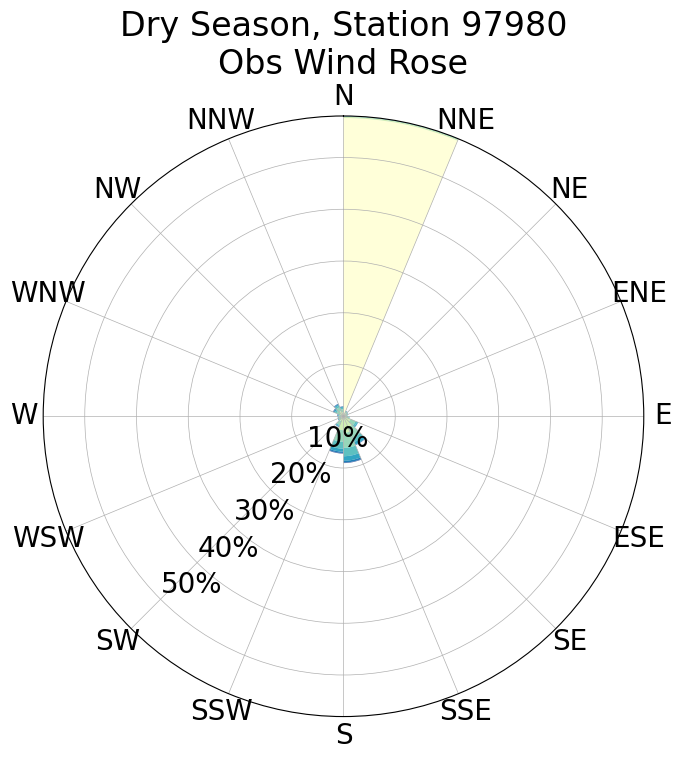

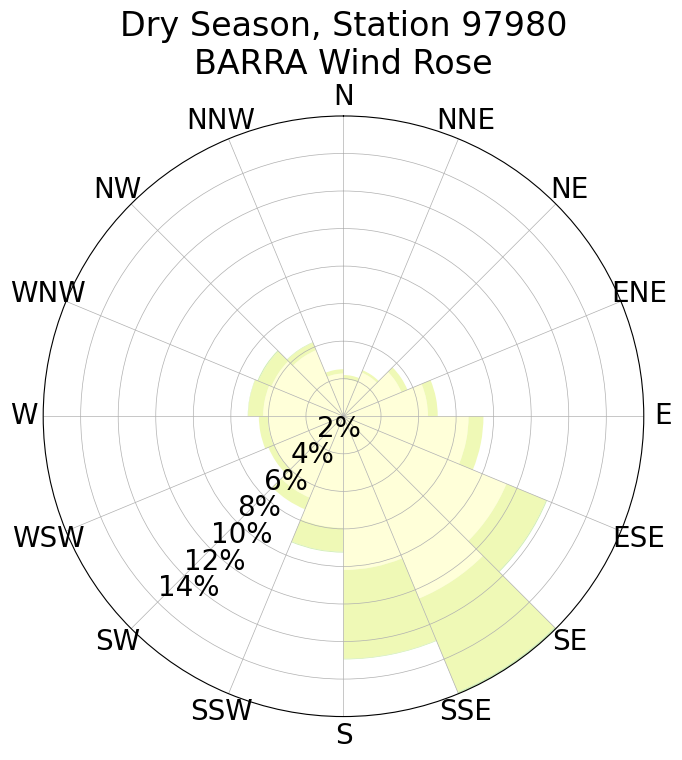

...

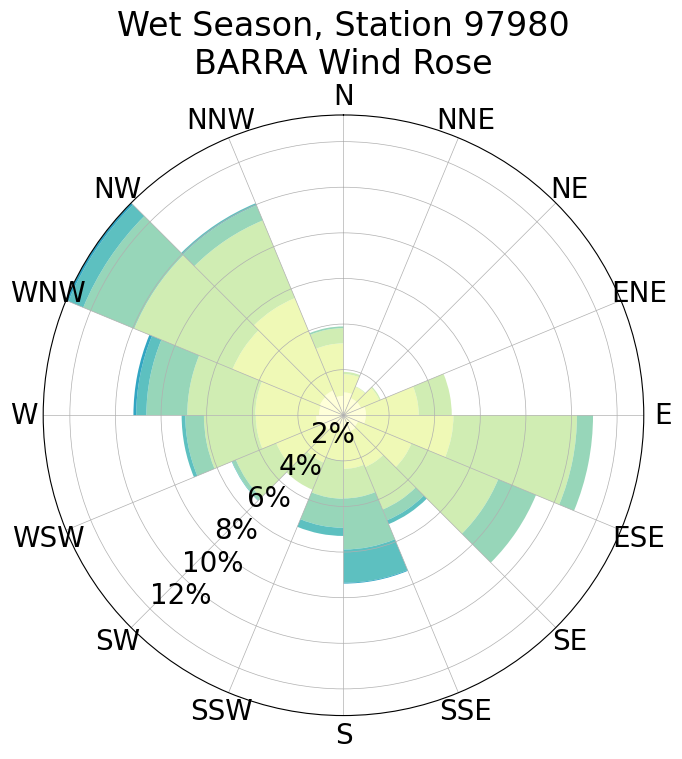

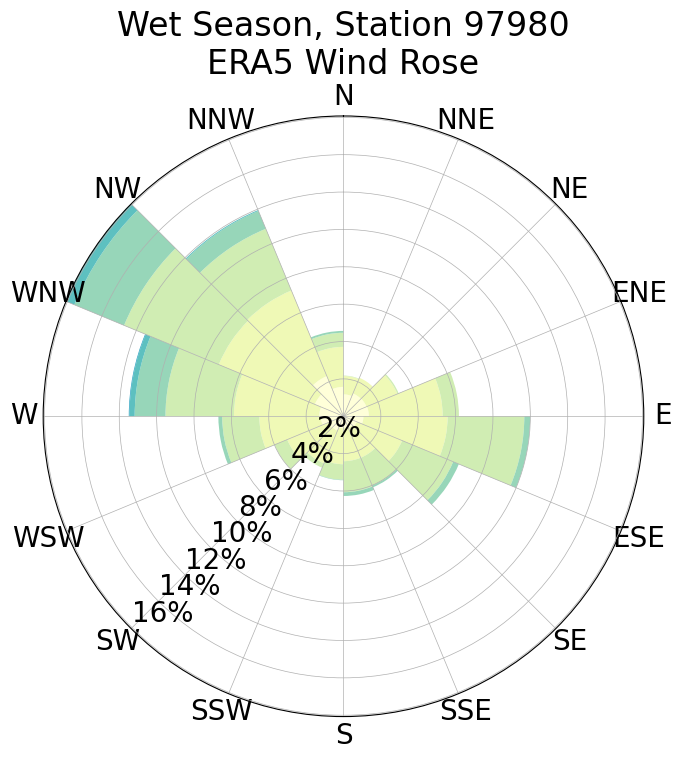

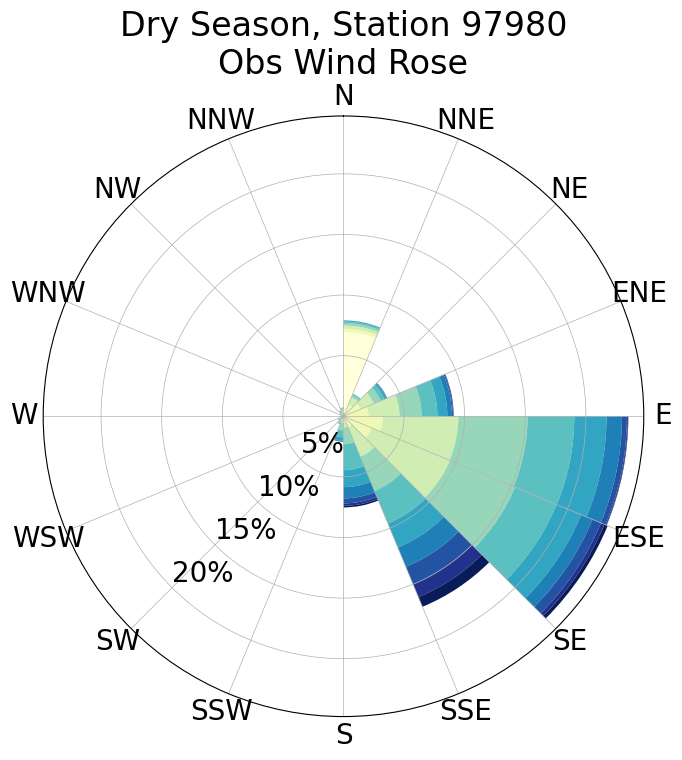

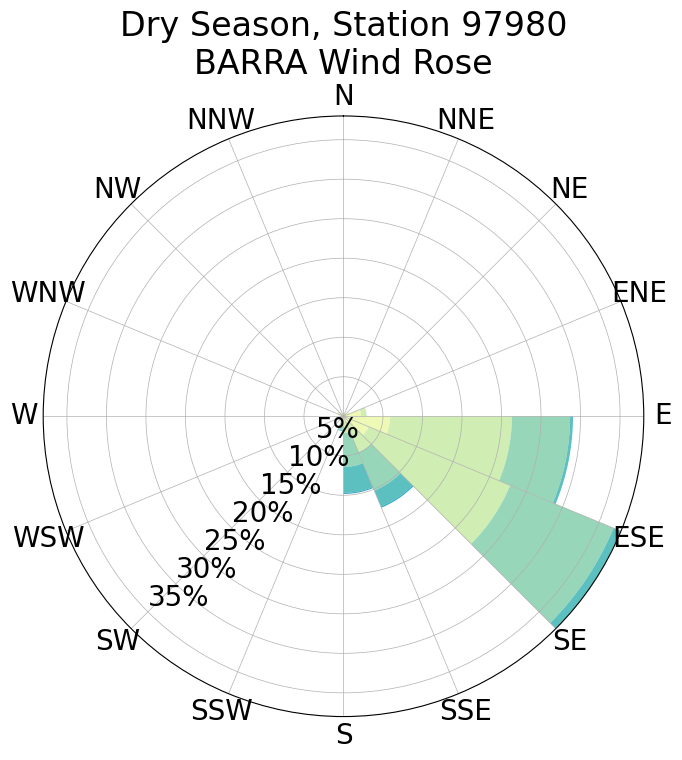

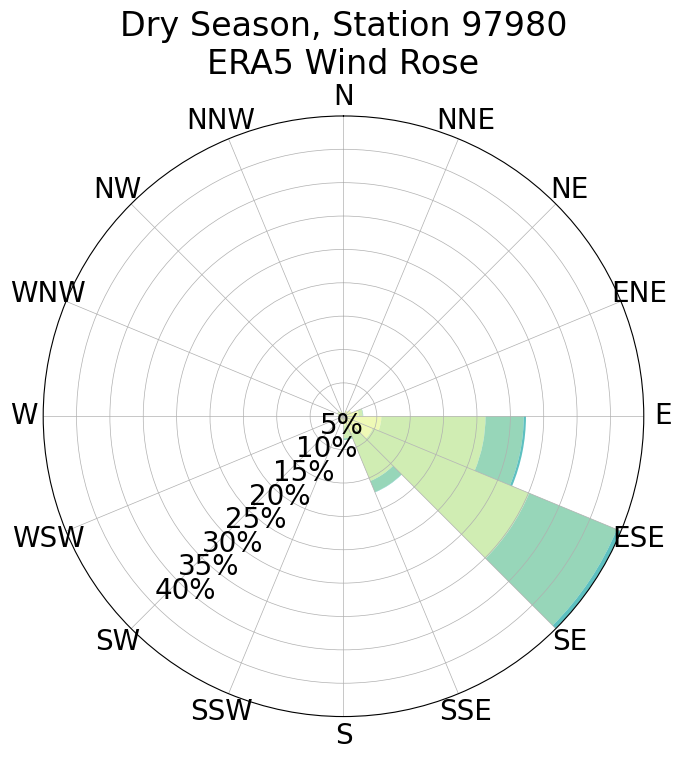

In [19]:
for station in daily_df['station_id'].unique():
    plot_windrose(wet_season_data[wet_season_data['station_id']==station], f'Wet Season, Station {int(station_id)}')
    plot_windrose(dry_season_data[dry_season_data['station_id']==station], f'Dry Season, Station {int(station_id)}')

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


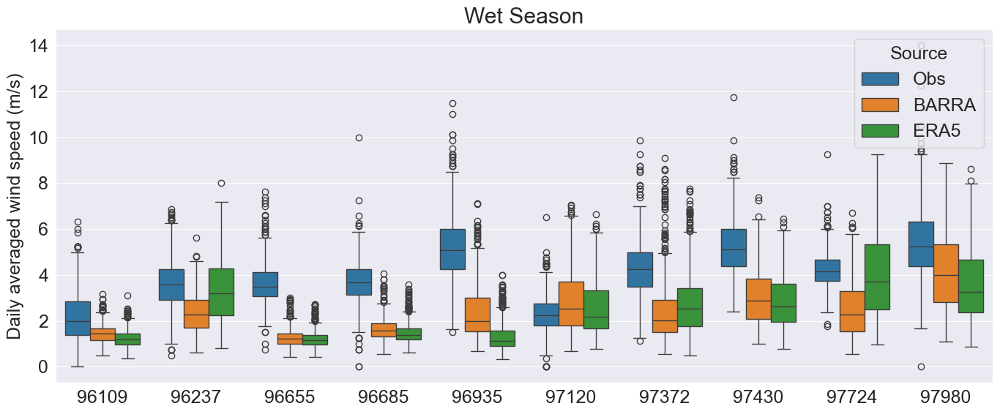

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


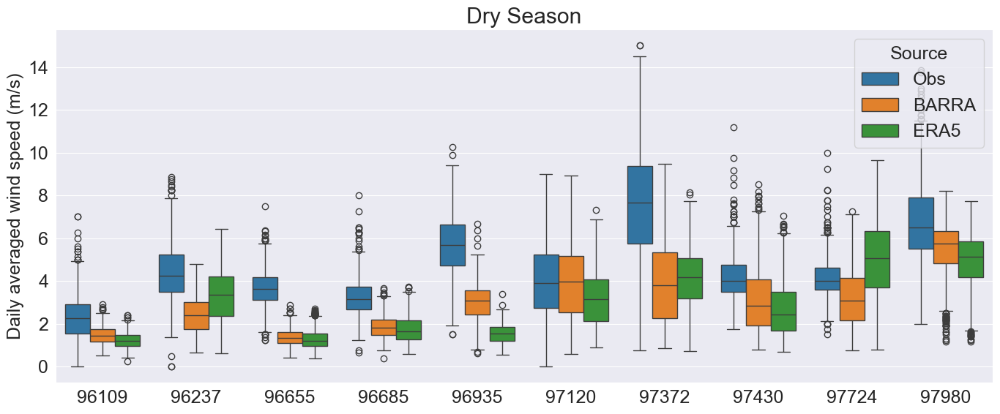

In [20]:
# daily_df['DATA TIMESTAMP'] = pd.to_datetime(daily_df['DATA TIMESTAMP'])
wet_season_data = daily_df[daily_df['DATA TIMESTAMP'].dt.month.isin([11, 12, 1, 2, 3])]
dry_season_data = daily_df[daily_df['DATA TIMESTAMP'].dt.month.isin([4, 5, 6, 7, 8, 9, 10])]
for idx, plot_data in enumerate([wet_season_data, dry_season_data]):
    plt.rcParams.update({'font.size': 18})
    
    melted_df = plot_data.melt(id_vars=["station_id"], value_vars=["WIND SPEED FF", "BARRA_WS", "ERA5_WS"], var_name="Source", value_name="Wind Speed")
    source_map = {"WIND SPEED FF": "Obs", "BARRA_WS": "BARRA", "ERA5_WS": "ERA5"}
    melted_df["Source"] = melted_df["Source"].map(source_map)
    
    plt.figure(figsize=(14, 6))
    sns.set_style("darkgrid")
    sns.boxplot(data=melted_df, x="station_id", y="Wind Speed", hue="Source")
    
    plt.title("Wet Season" if idx ==0 else "Dry Season")
    plt.xlabel("")
    plt.ylabel("Daily averaged wind speed (m/s)")
    plt.legend(title="Source", loc="upper right")
    # plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


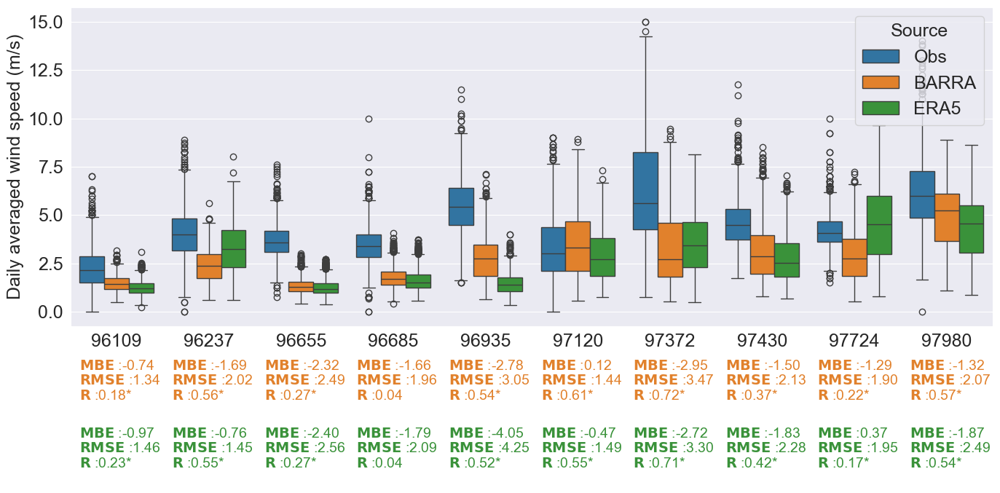

In [21]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams.update({'font.size': 18})

melted_df = daily_df.melt(id_vars=["station_id"], value_vars=["WIND SPEED FF", "BARRA_WS", "ERA5_WS"], var_name="Source", value_name="Wind Speed")
melted_df["Source"] = melted_df["Source"].map({"WIND SPEED FF": "Obs", "BARRA_WS": "BARRA", "ERA5_WS": "ERA5"})

plt.figure(figsize=(14, 8))
sns.set_style("darkgrid")
sns.boxplot(data=melted_df, x="station_id", y="Wind Speed", hue="Source")

for reanalysis_key in ["BARRA_WS", "ERA5_WS"]:
    for i, station in enumerate(daily_df['station_id'].unique()):
        df_station = daily_df[daily_df['station_id'] == station].dropna(subset=[reanalysis_key, 'WIND SPEED FF'])
        if len(df_station) == 0:
            continue
        r, p = stats.pearsonr(df_station[reanalysis_key], df_station['WIND SPEED FF'])
        star = "*" if p < 0.05 else ""
        mbe = (df_station[reanalysis_key] - df_station['WIND SPEED FF']).mean()
        rmse = np.sqrt(((df_station[reanalysis_key] - df_station['WIND SPEED FF']) ** 2).mean())
        label = rf"$\mathbf{{MBE}}$" + f" :{mbe:.2f}\n"+ rf"$\mathbf{{RMSE}}$" + f" :{rmse:.2f}\n" + rf"$\mathbf{{R}}$" + f" :{r:.2f}{star}\n"
        y_pos = (-5.5 if reanalysis_key=='BARRA_WS' else -9)
        plt.text(i-0.4, y_pos, label, ha='left', va='bottom', fontsize=14, color='#E1812C' if reanalysis_key=='BARRA_WS' else '#3A923A')

plt.xlabel("")
plt.ylabel("Daily averaged wind speed (m/s)")
plt.legend(title="Source", loc="upper right")
plt.tight_layout()
plt.show()


<Figure size 800x800 with 0 Axes>

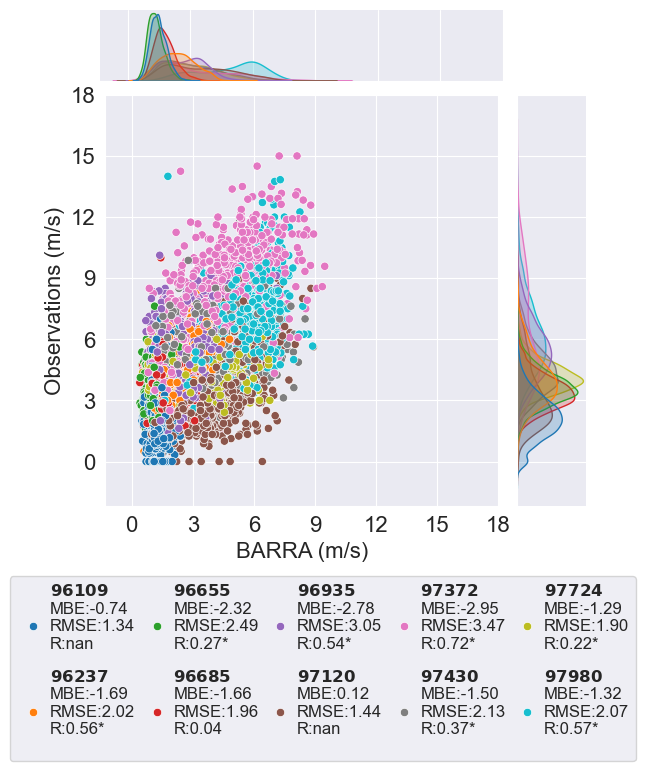

<Figure size 800x800 with 0 Axes>

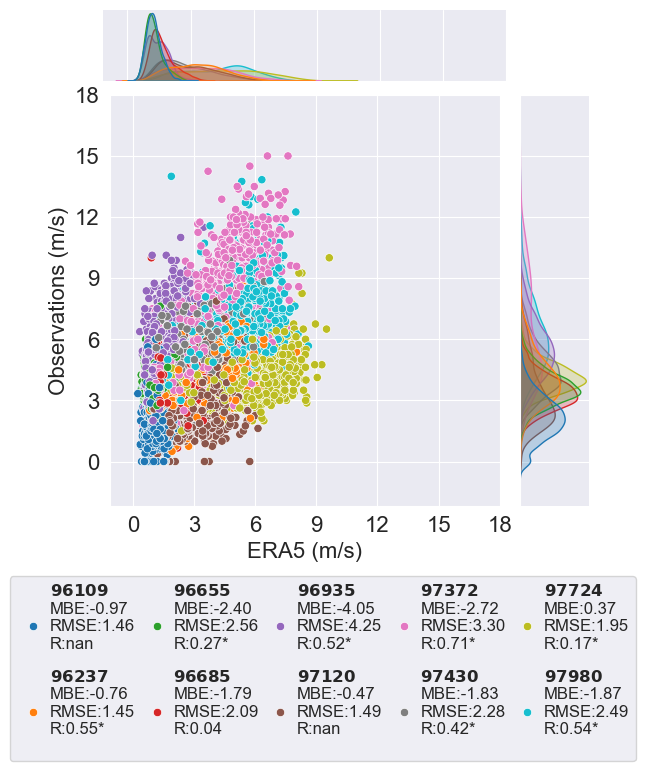

In [22]:
for reanalysis_key in ['BARRA_WS','ERA5_WS']:
    sns.set_style("darkgrid")
    corr_labels = {}
    for station in daily_df['station_id'].unique():
        df_station = daily_df[daily_df['station_id'] == station]
        r, p = stats.pearsonr(df_station[reanalysis_key], df_station['WIND SPEED FF'])
        star = "*" if p < 0.05 else ""
        mbe= (df_station[reanalysis_key] - df_station['WIND SPEED FF']).mean()
        rmse = np.sqrt(((df_station[reanalysis_key] - df_station['WIND SPEED FF']) ** 2).mean())
        corr_labels[station] =rf"$\mathbf{{{station}}}$" + f"\nMBE:{mbe:.2f}\nRMSE:{rmse:.2f}\nR:{r:.2f}{star}\n"
    
    daily_df['station_label'] = daily_df['station_id'].map(corr_labels)
    
    plt.figure(figsize=(8,8))
    plt.rcParams.update({'font.size': 16})
    g= sns.jointplot(data=daily_df, x=reanalysis_key, y="WIND SPEED FF", hue='station_label')
    g.ax_joint.set_aspect('equal', adjustable='box')
    g.ax_joint.set_xticks(range(0, 19, 3))
    g.ax_joint.set_yticks(range(0, 19, 3))
    g.set_axis_labels(f'{reanalysis_key[:-3]} (m/s)', 'Observations (m/s)', fontsize=16)
    plt.legend(ncol=5, bbox_to_anchor=(1.37, -0.15), fontsize=12, columnspacing=0.3, labelspacing=0, handletextpad=0)
    plt.show()


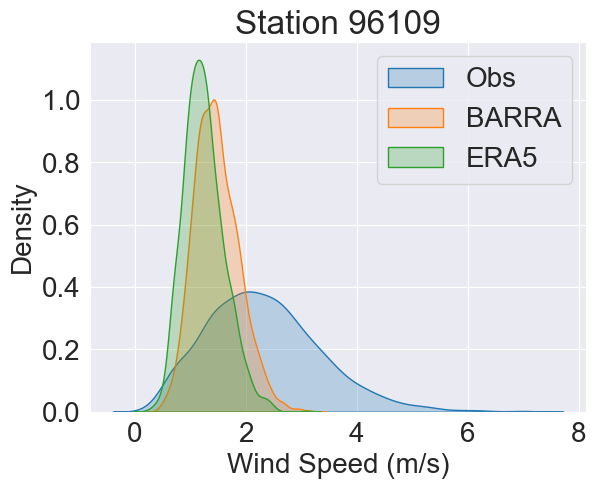

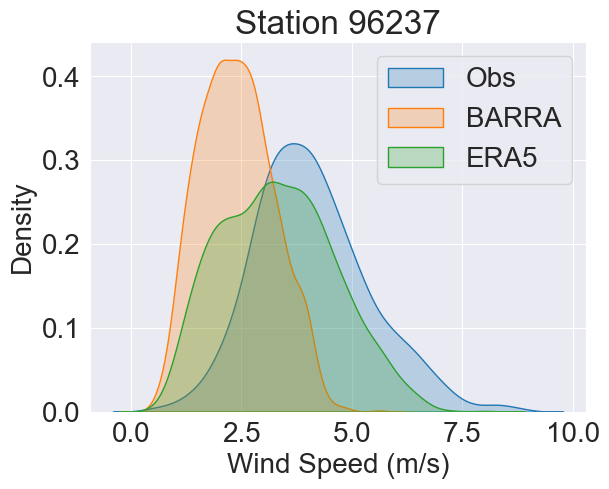

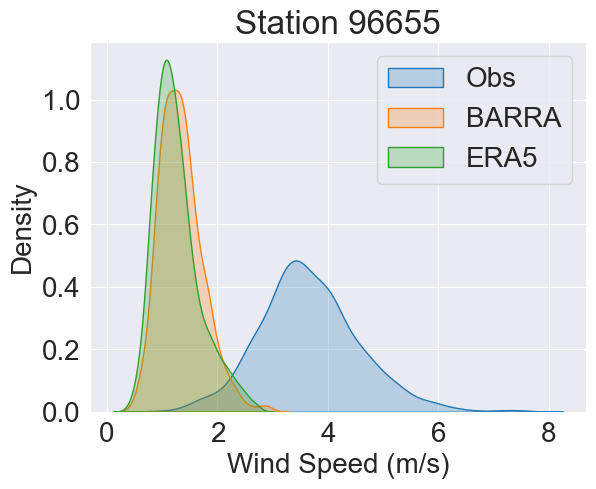

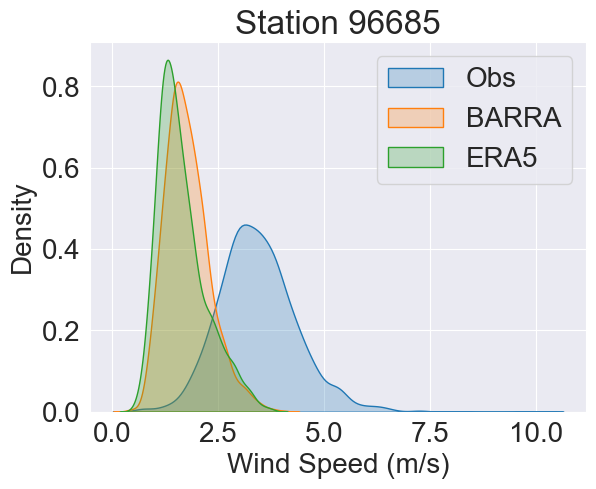

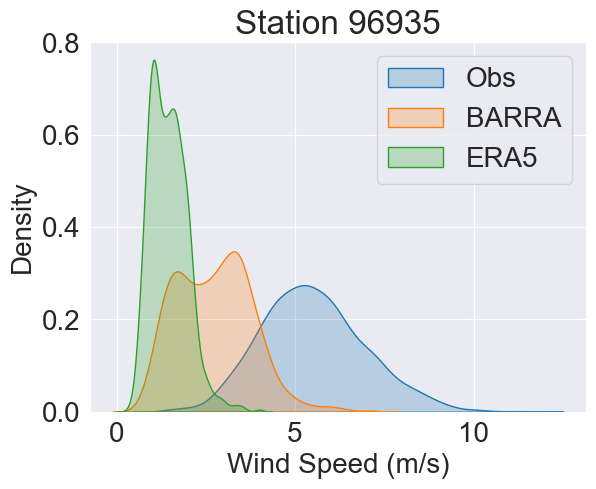

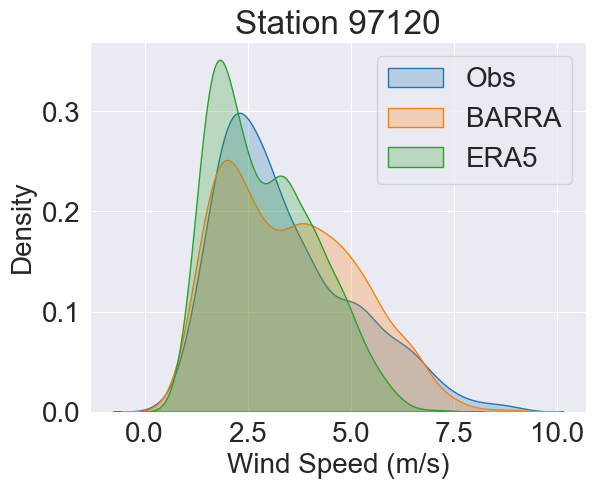

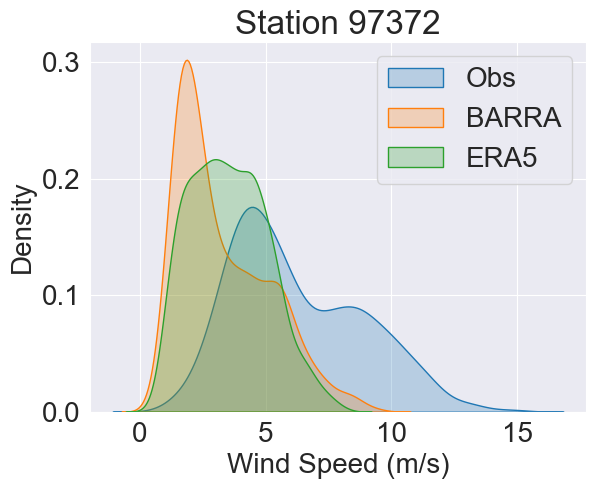

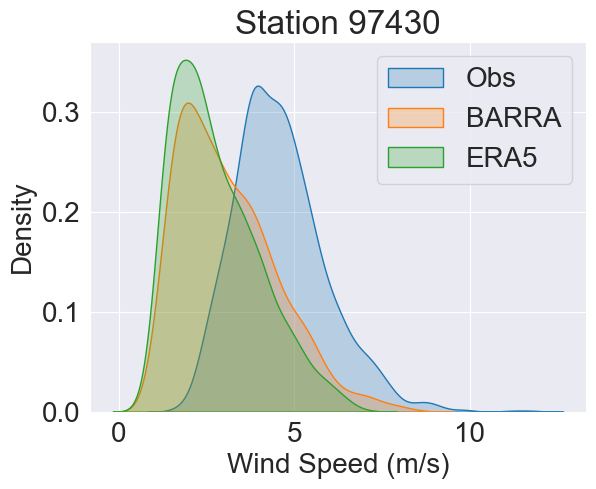

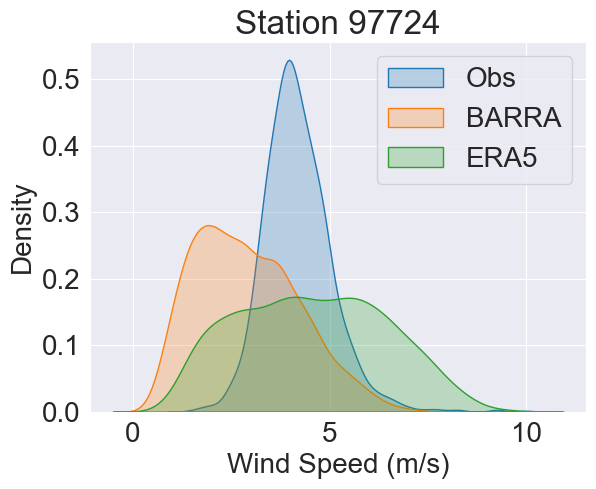

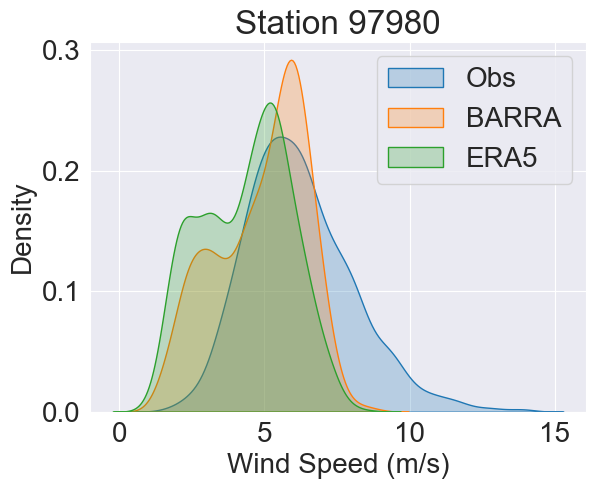

<Figure size 640x480 with 0 Axes>

In [23]:
from scipy.stats import pearsonr
for station in daily_df['station_id'].unique():
    # for utc_time in [0,6,12,18]:
        # plot_df = wind_station_df[wind_station_df['DATA TIMESTAMP'].dt.hour == utc_time]
    daily_df.replace(0, np.nan, inplace=True)
    daily_df = daily_df.dropna()
    plot_df = daily_df[daily_df['station_id']==station]

    plt.rcParams.update({'font.size': 20})
    sns.set_style("darkgrid")
    sns.kdeplot(data=plot_df, x="WIND SPEED FF", fill=True, label='Obs')
    sns.kdeplot(data=plot_df, x="BARRA_WS", fill=True, label='BARRA')
    sns.kdeplot(data=plot_df, x="ERA5_WS", fill=True, label='ERA5')
    plt.xlabel("Wind Speed (m/s)")
    plt.title(f"Station {station}")
    plt.legend()
    plt.show()
    plt.clf()

## BARRA max wind speed 

In [8]:
wind_station_latlon_df = pd.read_csv('/g/data/qz03/wp3/data/obs/wind-and-rain/hourly-wind/station_metadata.csv').drop(columns=['No']).dropna()
wind_station_df = pd.concat([pd.read_csv(f, parse_dates=['DATA TIMESTAMP']).assign(station_id=f.split('_')[0].split('/')[-2]) for f in glob.glob('/g/data/qz03/wp3/data/obs/wind-and-rain/hourly-wind/*/*.csv')], ignore_index=True)#.replace(0, np.nan, inplace=True)

barra_windspeedmax_day = xr.open_mfdataset(glob.glob('/g/data/qz03/wp3/data/reanalysis/BARRAR2/day/sfcWindmax/*.nc'),combine='nested', concat_dim='time',parallel=True, engine='netcdf4').chunk({'time':-1, 'lat':'auto', 'lon':'auto'})

In [9]:
def grid_box_select(barra_max_ws):
    mas_ws= []
    for lat_offset, lon_offset in itertools.product([-0.1, 0, 0.1], [-0.1, 0, 0.1]):
        mas_ws.append(barra_max_ws.sel(lat=lat+lon_offset, lon=lon, method='nearest').compute().sortby("time"))
    ws_pt = xr.concat(mas_ws, dim='z').mean('z').compute().sortby("time")
    return ws_pt

In [23]:
agg_df = []
for station_id in wind_station_latlon_df['WMO ID']:
    sid_str = f"{station_id:.0f}"
    lat, lon = wind_station_latlon_df.loc[wind_station_latlon_df['WMO ID'] == station_id, ['Lat', 'Lon']].values[0]
    station_df = wind_station_df[wind_station_df['station_id'] == sid_str].copy()
    station_df['DATA TIMESTAMP'] = pd.to_datetime(station_df['DATA TIMESTAMP'])
    station_df = station_df.groupby([station_df['DATA TIMESTAMP'].dt.to_period('D'), 'station_id']).max(numeric_only=True).reset_index()
    
    # BARRA extract
    ws_pt = barra_windspeedmax_day.sel(lat=lat, lon=lon, method='nearest').compute().sortby("time") if grid_box_select_switch == False else grid_box_select(barra_windspeedmax_day)

    # Convert to pandas Series and reset index
    barra_ws_series = ws_pt.sfcWindmax.to_series().reset_index(name='BARRA_WS').sort_values('time')
    barra_ws_series = barra_ws_series.groupby([barra_ws_series['time'].dt.to_period('D'), 'BARRA_WS']).max(numeric_only=True).reset_index()
    
    # Merge station data with reanalysis data on time
    df = pd.merge_asof(station_df.sort_values('DATA TIMESTAMP'), barra_ws_series, left_on='DATA TIMESTAMP', right_on='time', direction='nearest').drop(columns='time')
    agg_df.append(df)

In [27]:
daily_df = pd.concat(agg_df)

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


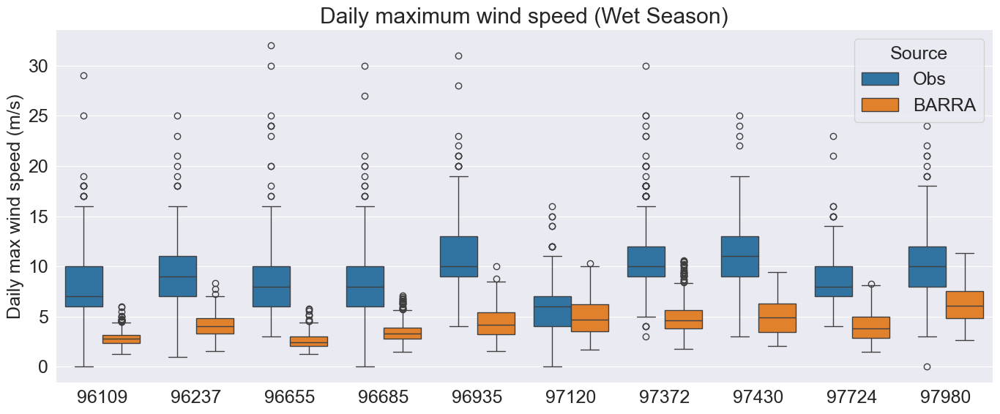

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


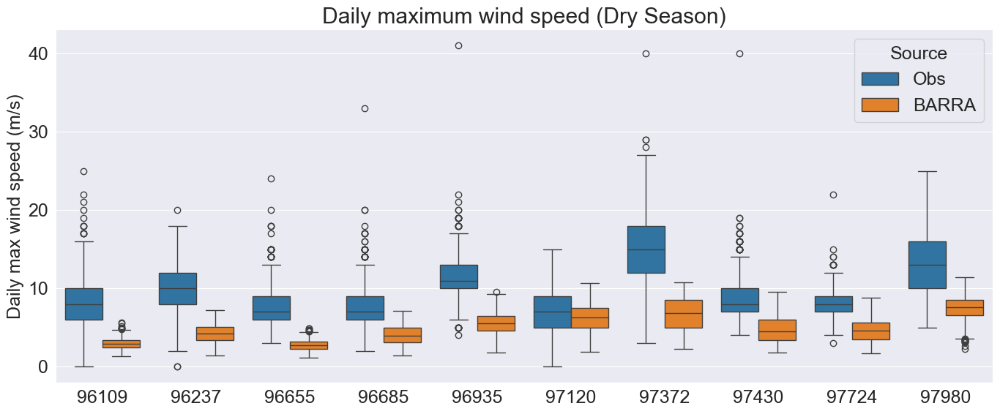

In [31]:
# daily_df['DATA TIMESTAMP'] = pd.to_datetime(daily_df['DATA TIMESTAMP'])
wet_season_data = daily_df[daily_df['DATA TIMESTAMP'].dt.month.isin([11, 12, 1, 2, 3])]
dry_season_data = daily_df[daily_df['DATA TIMESTAMP'].dt.month.isin([4, 5, 6, 7, 8, 9, 10])]
for idx, plot_data in enumerate([wet_season_data, dry_season_data]):
    plt.rcParams.update({'font.size': 18})
    
    melted_df = plot_data.melt(id_vars=["station_id"], value_vars=["WIND SPEED FF", "BARRA_WS"], var_name="Source", value_name="Wind Speed")
    source_map = {"WIND SPEED FF": "Obs", "BARRA_WS": "BARRA"}
    melted_df["Source"] = melted_df["Source"].map(source_map)
    
    plt.figure(figsize=(14, 6))
    sns.set_style("darkgrid")
    sns.boxplot(data=melted_df, x="station_id", y="Wind Speed", hue="Source")
    
    plt.title(f'Daily maximum wind speed ({"Wet Season" if idx == 0 else "Dry Season"})')
    plt.xlabel("")
    plt.ylabel("Daily max wind speed (m/s)")
    plt.legend(title="Source", loc="upper right")
    # plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
